# Project 2 report

**Student name: Chang Lu(s2157323), Lin Lin(s2163449), Peilin Long(s2038784)**

## Abstract: 

Recently the agency of improving air quality has become a global issue, as a result, governments offer supports financially and politically to tackle this problem. Here we analyze air quality in a certain country, China. 

In part 1, we cluster the 30 provinces in China into 6 classes and compare the differences and similarities in and between each class.

In part 2, we aim to find out the geographical and meteorological factors (geographical factors: latitude, longitude, elevation and population; meteorological factors: manual average temperature, manual average wind speed, manual average precipitation and manual average sea-level air pressure) contributing to the emission of SO2 and PM2.5 pollution. And we find that both PM2.5 and SO2 emission have negative relation with average temperature, average wind speed and average precipitation, and positive relation with average sea-level air pressure. 

Then in part 3, we visualize the general air quality of provinces by analyzing the air quality data about each province’s capital city, where we find that pollution around Beijing is the most serious. But interestingly, although Beijing is surrounded by heavily polluted cities, the pollution condition in Beijing is not serious. The corresponding commands, we choose Beijing to analyze the 5 air pollutants in detail in the year of 2020. To begin with, we find out all locations with valid data about 5 air pollutants which we are interested in. Using the method PCA to separate the 5 air pollutants into two components (2 groups), and scored for each component’s contribution to pollutant emission in every month in 2020. Then, we explain the result by visualize analysis and verify the conclusion in part 2, which confirm our opinion.  


In [1]:
import numpy as np
import requests
import openaq
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

warnings.simplefilter('ignore')

%matplotlib inline

# Set major seaborn asthetics
sns.set("notebook", style='ticks', font_scale=1.0)

# Increase the quality of inline plots
mpl.rcParams['figure.dpi']= 500

print ("pandas v{}".format(pd.__version__))
print ("matplotlib v{}".format(mpl.__version__))
print ("seaborn v{}".format(sns.__version__))
print ("openaq v{}".format(openaq.__version__))

pandas v1.1.3
matplotlib v3.3.1
seaborn v0.11.0
openaq v1.1.0


## part one

In this project, we pick china as the aim area for analysis.

First, we took an overall observation with change of PM2.5 in each province, to see the overall changes. Then use K-Means clustering method to divide the province of similar pattern into one category. The numbers of clusters are determined by the ESS features(an evaluating indicator) with the number of clusters. Then draw the pictures of each clusters to show the similar changing method in the same clusters and show the difference pattern of pictures in different clusters.

In [2]:
api = openaq.OpenAQ()
locations = api.locations(city = '北京市', df=True)
df = api.measurements(city = '北京市', location = locations['locations'][0],parameter = 'pm25', limit=50000, df=True)
df.head()

,location,parameter,value,unit,country,city,date.utc,coordinates.latitude,coordinates.longitude
date.local,,,,,,,,,
2021-08-09 19:00:00,奥体中心,pm25,10,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,2021-08-09 11:00:00+00:00,39.9821,116.3966
2021-08-08 16:00:00,奥体中心,pm25,32,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,2021-08-08 08:00:00+00:00,39.9821,116.3966
2021-08-08 15:00:00,奥体中心,pm25,49,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,2021-08-08 07:00:00+00:00,39.9821,116.3966
2021-08-08 14:00:00,奥体中心,pm25,50,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,2021-08-08 06:00:00+00:00,39.9821,116.3966
2021-08-08 13:00:00,奥体中心,pm25,50,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,2021-08-08 05:00:00+00:00,39.9821,116.3966


In [3]:
# set a list to store all cities of China
provincial_capital = ['济南市','北京市','上海市','天津市','重庆市','哈尔滨市',
                     '长春市','沈阳市','呼和浩特市','石家庄市','乌鲁木齐市','兰州市','西宁市',
                     '西安市','银川市','郑州市','太原市','合肥市','武汉市','长沙市','南京市',
                     '成都市','贵阳市','昆明市','南宁市','拉萨市','杭州市','南昌市','广州市',
                     '福州市','海口市']
# calculate pm_seires, it is the time series of mean value with PM2.5 of each city
pm_series = pd.DataFrame()
for i in range(len(provincial_capital)):
    city = provincial_capital[i]
    locations = api.locations(city = city, df=True)
    # Derive data from openaq
    df = api.measurements(city = city, location = locations['locations'][0],parameter = 'pm25', limit=50000, df=True)
    year = []
    month = []
    # Append the corespending year and month to the end of each row
    for j in range(len(df)):
        year.append(df['date.utc'][j].year)
        month.append(df['date.utc'][j].month)
    df['year'] = year
    df['month'] = month
    # Calculate the data mean
    result = df.groupby(['year','month']).mean()['value']
    pm_series[city] = result
# Output csv form
pm_series.to_csv('pm_series.csv')
pm_series = pd.read_csv('pm_series.csv')

check the nan value in series, we can find that there are two series contain nan value,"呼和浩特市" and "乌鲁木齐市".

In [4]:
pm_series.isnull().any().values

array([False, False, False, False, False, False, False, False, False,
       False,  True, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [5]:
pm_series.isnull().any()

year     False
month    False
济南市      False
北京市      False
上海市      False
天津市      False
重庆市      False
哈尔滨市     False
长春市      False
沈阳市      False
呼和浩特市     True
石家庄市     False
乌鲁木齐市     True
兰州市      False
西宁市      False
西安市      False
银川市      False
郑州市      False
太原市      False
合肥市      False
武汉市      False
长沙市      False
南京市      False
成都市      False
贵阳市      False
昆明市      False
南宁市      False
拉萨市      False
杭州市      False
南昌市      False
广州市      False
福州市      False
海口市      False
dtype: bool

Observing the condition of 'NAN‘ for '呼和浩特市'.

From the result we can see that this columns missing almost half of values in front, so just delete this whole column for better anlysis.

In [6]:
pm_series['呼和浩特市']

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
5            NaN
6            NaN
7            NaN
8            NaN
9            NaN
10           NaN
11           NaN
12           NaN
13           NaN
14           NaN
15    160.681922
16     45.986765
17     24.502128
18     22.784689
19     24.489028
20     18.838284
21     19.486239
22     16.287812
23     15.538690
24     28.779845
25     35.706260
26     42.085366
27     49.483721
28     41.128801
29     55.552469
30     27.386640
31     29.812352
32     17.122768
33     11.849057
34     52.618421
Name: 呼和浩特市, dtype: float64

In [4]:
pm_series = pm_series.drop('呼和浩特市',axis = 1)

Check the result for '乌鲁木齐市'.

Here only exist one NAN value, so just use the average value of data before and after to fit this value.

In [8]:
pm_series['乌鲁木齐市']

0      50.215190
1      92.191919
2     140.928571
3     190.217759
4     147.052632
5     109.331658
6      27.229483
7      34.248538
8      24.134513
9      28.599388
10     24.922426
11     27.205247
12     43.947214
13     78.946023
14    146.760055
15    204.833561
16    108.723122
17     41.537063
18     33.915385
19     28.781646
20     27.745267
21     26.662566
22           NaN
23     18.062044
24     40.246177
25     54.780291
26    199.796848
27    167.410413
28    153.038462
29     59.611916
30     24.028689
31     33.672131
32     21.089412
33     26.173077
34     27.625000
Name: 乌鲁木齐市, dtype: float64

In [8]:
pm_series['乌鲁木齐市'][22] = (pm_series['乌鲁木齐市'][21] + pm_series['乌鲁木齐市'][23])/2

22.362304850358548

Transpose data in order to let python know that each province is a variable, not the date.

In [10]:
dataset = pm_series.iloc[:,2:].stack()
dataset = dataset.unstack(0)
dataset.head()

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
济南市,55.842553,104.841837,75.238554,121.341463,102.206827,64.224165,52.627628,36.341360,33.179396,33.568276,...,64.408428,89.645907,82.093702,56.007168,63.220497,37.468041,36.566745,28.824444,22.250696,26.671233
北京市,36.464358,65.413445,44.037585,65.610459,57.015733,49.857932,43.978863,33.565066,32.485950,32.107044,...,38.899213,28.099145,40.246988,62.515734,86.754198,36.302000,26.250559,20.806522,16.822581,36.467532
上海市,31.609562,40.115578,33.940639,50.030369,39.406615,50.209340,37.990712,31.400000,27.271215,25.097796,...,27.293651,40.115917,39.459091,29.519298,38.104938,33.122917,28.103175,22.482143,15.834239,11.078947
天津市,47.823529,85.843854,48.870968,93.223404,88.366667,55.003145,50.403226,44.527817,42.439868,43.000000,...,48.498387,46.932384,49.978261,59.767986,75.349379,43.739308,33.227991,36.106904,27.773842,46.740260
重庆市,49.281938,50.567291,55.712871,80.890585,49.664557,51.001585,30.033923,34.233051,27.355593,21.495690,...,37.755738,56.154514,62.321267,54.419014,33.197550,25.758065,29.338824,29.841410,17.502703,28.909091


In [11]:
pip install sklearn

  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1321 sha256=f038e4ac0a3be3a7544d31cfc39e081cd437632df0a4594d3ef3f6cc5bd55fe0
  Stored in directory: c:\users\linli\appdata\local\pip\cache\wheels\22\0b\40\fd3f795caaa1fb4c6cb738bc1f56100be1e57da95849bfc897
Successfully built sklearn
Note: you may need to restart the kernel to use updated packages.


Use 'silhouette_score' from 'sklearn.metrics' to see the scores of different division. This score indicate the effect of clustering, smaller value represent a better result of clustering.

It is easy to understand more clusters indicates better result, with no doubts that dividing the date into clusters as much as possible will bring a good outcome. But obvioursly we can not do this, since such behavior just makes no senses. So we just choose the clusters number which is not so larger, but can also bring a reslut which is not bad, and in this data the cluster numbers = 6.

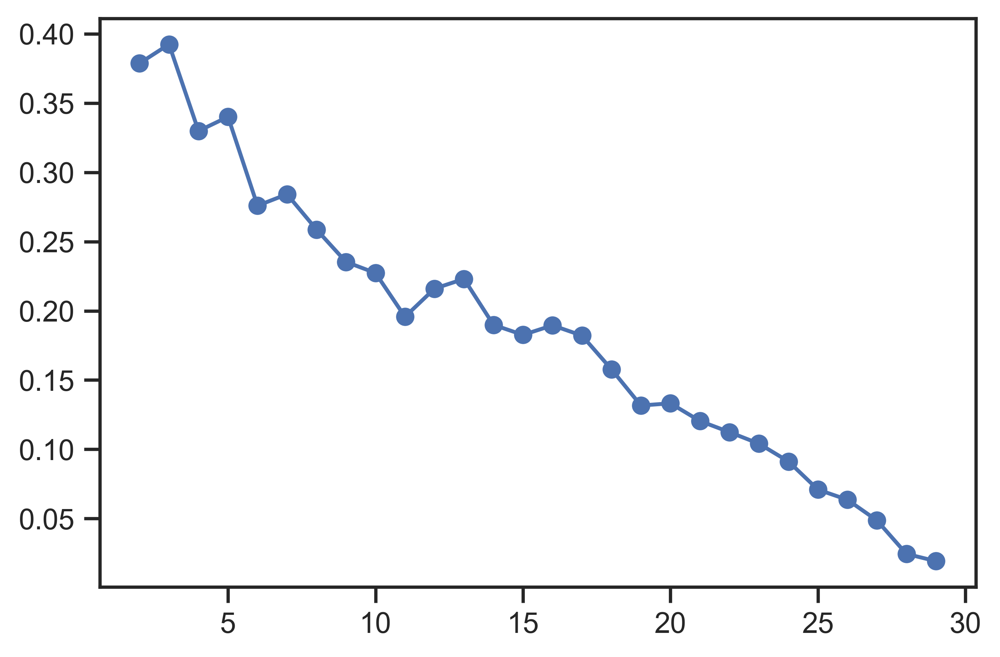

In [12]:
Scores = [] 
for k in range(2,len(dataset)):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(dataset)
    Scores.append(silhouette_score(dataset,kmeans.labels_,metric='euclidean'))
X = range(2,len(dataset))
plt.plot(X,Scores,'o-')
plt.show()

After we training the cluster, we assign the result of cluster to our dataset as a new column called 'class' to indicate which class the each city in each row belongs to.

In [13]:
#assigning the result of clustering to dataset
y_pred = KMeans(n_clusters=6, random_state=9).fit_predict(dataset)
dataset['class'] = y_pred
dataset.head()

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,class
济南市,55.842553,104.841837,75.238554,121.341463,102.206827,64.224165,52.627628,36.341360,33.179396,33.568276,...,89.645907,82.093702,56.007168,63.220497,37.468041,36.566745,28.824444,22.250696,26.671233,4
北京市,36.464358,65.413445,44.037585,65.610459,57.015733,49.857932,43.978863,33.565066,32.485950,32.107044,...,28.099145,40.246988,62.515734,86.754198,36.302000,26.250559,20.806522,16.822581,36.467532,5
上海市,31.609562,40.115578,33.940639,50.030369,39.406615,50.209340,37.990712,31.400000,27.271215,25.097796,...,40.115917,39.459091,29.519298,38.104938,33.122917,28.103175,22.482143,15.834239,11.078947,1
天津市,47.823529,85.843854,48.870968,93.223404,88.366667,55.003145,50.403226,44.527817,42.439868,43.000000,...,46.932384,49.978261,59.767986,75.349379,43.739308,33.227991,36.106904,27.773842,46.740260,4
重庆市,49.281938,50.567291,55.712871,80.890585,49.664557,51.001585,30.033923,34.233051,27.355593,21.495690,...,56.154514,62.321267,54.419014,33.197550,25.758065,29.338824,29.841410,17.502703,28.909091,5


Since it is difficult to draw all pictures into one canvas. So I just plot them separately.

From the results we can easily find the difference between two cluters and observe the similarity of pattern for pictures at the same cluster.

In [14]:
# Create a date index as the x axis of our plot 
X = pd.date_range('10/1/2018','09/1/2021',freq='BM')

In [15]:
class0_sample = dataset[dataset['class'] == 0].iloc[:,:35]
class0_index = class0_sample.index[:]
print(class0_index.values)

['哈尔滨市' '长春市' '沈阳市']


First cluster cantains 3 cities:'哈尔滨市', '长春市', '沈阳市'.

From the picture we can see that the change of data are similar, all have 4 peak value, which appear at the same period.

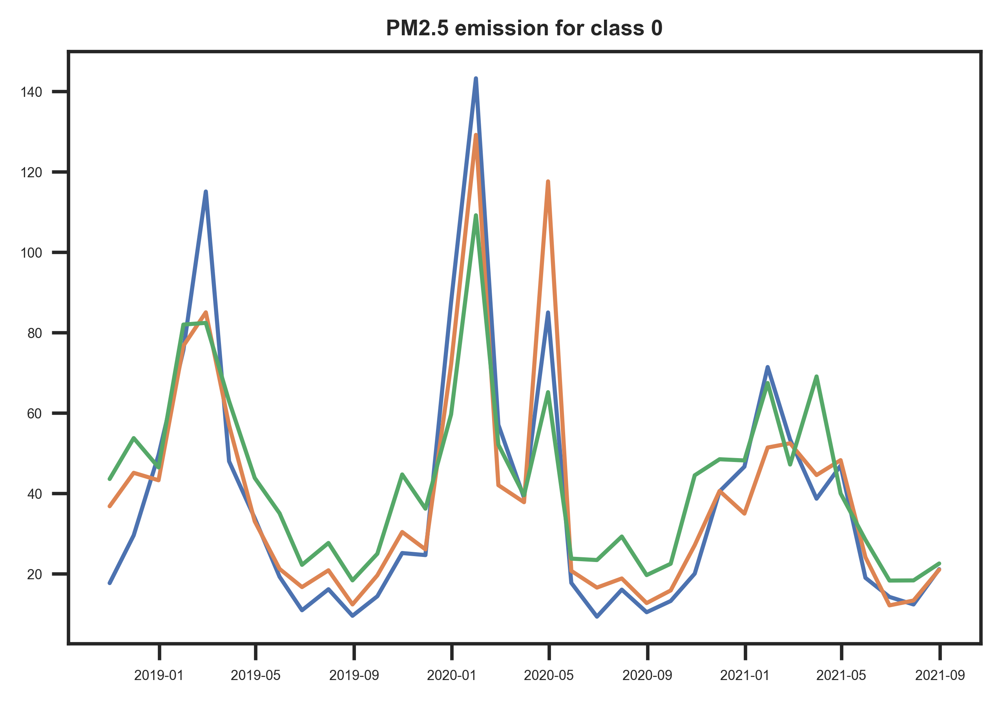

In [16]:
figure, ax0 = plt.subplots()
for i in range(len(class0_index)):
    plt.plot(X,class0_sample.iloc[i,:])
    plt.tick_params(labelsize=5)


ax0.set_title('PM2.5 emission for class 0',fontdict=dict(fontsize=8,weight='bold'))
plt.show()

In [17]:
class1_sample = dataset[dataset['class'] == 1].iloc[:,:35]
class1_index = class1_sample.index[:]
print(class1_index.values)

['上海市' '兰州市' '西宁市' '银川市' '南京市' '贵阳市' '南宁市' '杭州市']


Second cluster cantains 8 cities:'上海市', '兰州市', '西宁市', '银川市', '南京市', '贵阳市', '南宁市', '杭州市'

This picture is messier, since it has 8 cities, but we can also conclude that the pattern of changing are similiar.

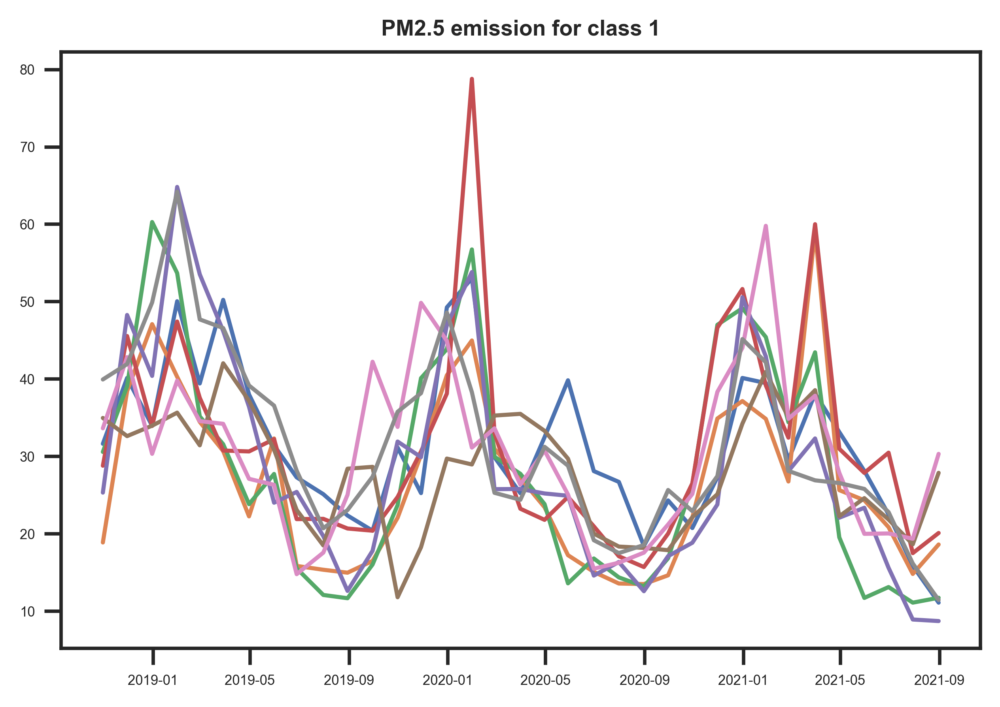

In [18]:
figure, ax1 = plt.subplots()
for i in range(len(class1_index)):
    plt.plot(X,class1_sample.iloc[i,:])
    plt.tick_params(labelsize=5)
    
ax1.set_title('PM2.5 emission for class 1',fontdict=dict(fontsize=8,weight='bold'))
plt.show()

In [19]:
class2_sample = dataset[dataset['class'] == 2].iloc[:,:35]
class2_index = class2_sample.index[:]
print(class2_index.values)

['昆明市' '拉萨市' '南昌市' '广州市' '福州市' '海口市']


Third cluster cantains 6 cities:'昆明市', '拉萨市', '南昌市', '广州市', '福州市', '海口市'

We can only conclude some seasonal trend from this picture, the same point is that the value are all below 50, which is much smaller than other cities.

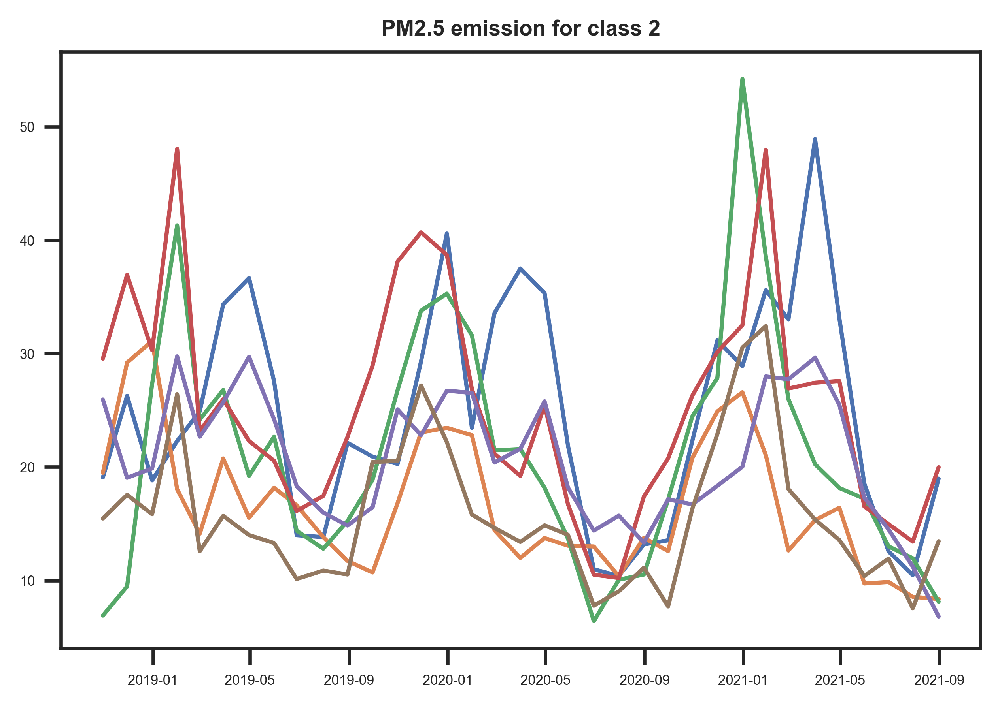

In [20]:
figure, ax2 = plt.subplots()
for i in range(len(class2_index)):
    plt.plot(X,class2_sample.iloc[i,:])
    plt.tick_params(labelsize=5)
    
ax2.set_title('PM2.5 emission for class 2',fontdict=dict(fontsize=8,weight='bold'))
plt.show()

In [21]:
class3_sample = dataset[dataset['class'] == 3].iloc[:,:35]
class3_index = class3_sample.index[:]
print(class3_index.values)

['乌鲁木齐市']


Fourth cluster only cantains 1 cities:'乌鲁木齐市'

The features of this city is obvious, and no one has the same trend as this city, so it beaome a singular cluter only with itself.

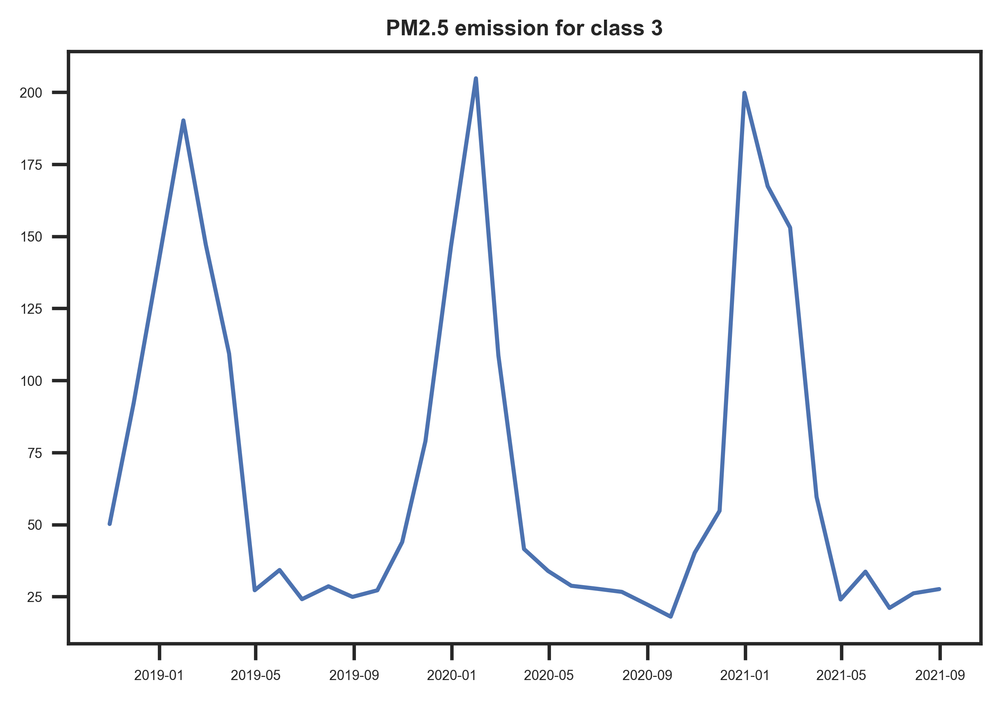

In [22]:
figure, ax3 = plt.subplots()
for i in range(len(class3_index)):
    plt.plot(X,class3_sample.iloc[i,:])
    plt.tick_params(labelsize=5)
    
ax3.set_title('PM2.5 emission for class 3',fontdict=dict(fontsize=8,weight='bold'))
plt.show()

In [23]:
class4_sample = dataset[dataset['class'] == 4].iloc[:,:35]
class4_index = class4_sample.index[:]
print(class4_index.values)

['济南市' '天津市' '西安市' '郑州市' '太原市']


Fifth cluster only cantains 5 cities:'济南市', '天津市', '西安市', '郑州市', '太原市'

The change of PM2.5 fllows the same direction, although hard to say this in recent years, but it is similar in 2019 and 2020.

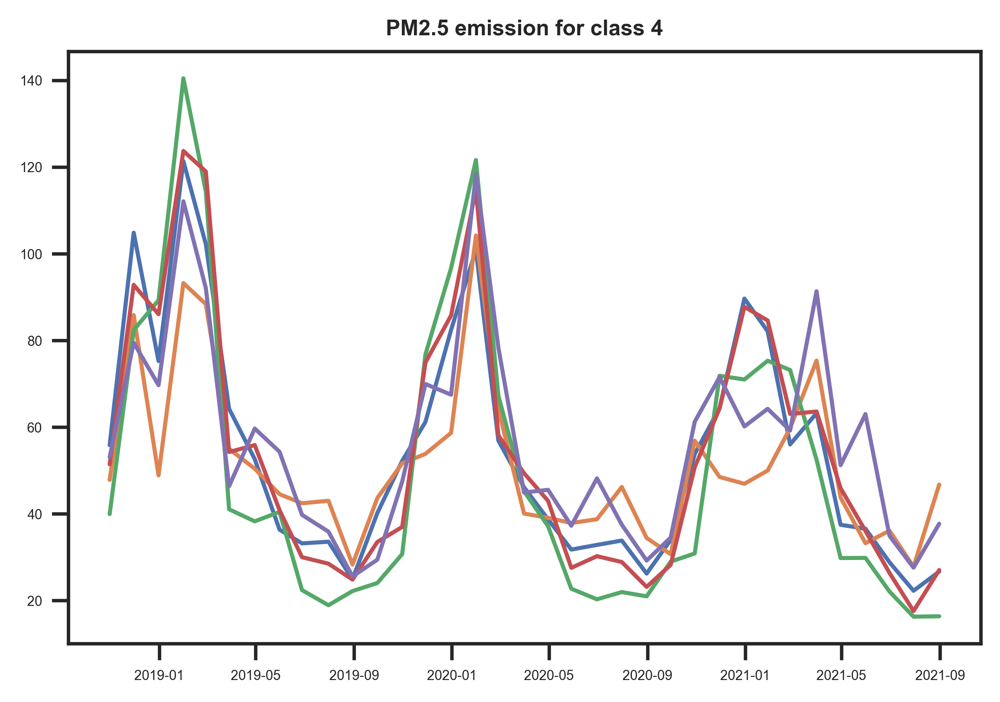

In [24]:
figure, ax4 = plt.subplots()
for i in range(len(class4_index)):
    plt.plot(X,class4_sample.iloc[i,:])
    plt.tick_params(labelsize=5)

ax4.set_title('PM2.5 emission for class 4',fontdict=dict(fontsize=8,weight='bold'))
plt.show()

In [25]:
class5_sample = dataset[dataset['class'] == 5].iloc[:,:35]
class5_index = class5_sample.index[:]
print(class5_index.values)

['北京市' '重庆市' '石家庄市' '合肥市' '武汉市' '长沙市' '成都市']


Sixth cluster only cantains 7 cities:'北京市', '重庆市', '石家庄市', '合肥市', '武汉市', '长沙市', '成都市'

All of them are inland cities, and the picture shows a similar patern.

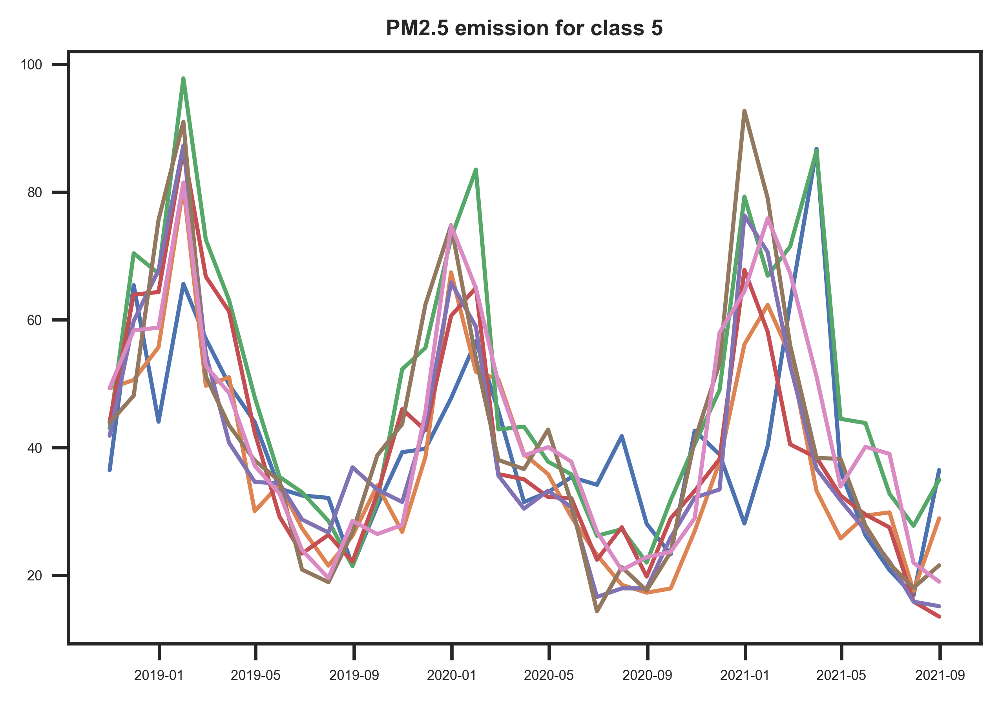

In [26]:
figure, ax5 = plt.subplots()
for i in range(len(class5_index)):
    plt.plot(X,class5_sample.iloc[i,:])
    plt.tick_params(labelsize=5)

ax5.set_title('PM2.5 emission for class 5',fontdict=dict(fontsize=8,weight='bold'))
plt.show()

In order to show the overview of PM2.5 in each city, we calculate the average value wthin these 3 years, and illustrate them on China Map.(since the value in Inner Mongolia('呼和浩特市') missing so much values, and we remove this value, so from this picture we can see nothing about this city).

## part two

Here we mainly focus on two kinds of air pollution parameter: PM2.5 and SO2. In this part, we collect air quality data about emission of these two air pollution parameters in 25 capital cities in China, including Beijing, Shanghai, Wuhan, Changsha, Shenyang, Chongqing, Tianjin, Hangzhou, Changchun, Hefei, Shenzhen, Guangzhou, Xining, Shijiazhuang, Nanjing, Kunming, Jinan, Zhengzhou, Guiyang, Fuzhou, Haikou, Lanzhou, Nanning, Xi'an, Hohhot and we also analyze 8 potential factors which may contribute to the emission of SO2 and PM2.5 pollution. We classify them as two groups, one is geographical factors: latitude, longitude, elevation and population, the other one is meteorological factors: annual average temperature, annual average wind speed, annual average precipitation and annual average sea-level air pressure.

In [30]:
# Two lists for 25 captital cities' names in English and Chinese
city_name_EN=['beijing','shanghai','wuhan','changsha','shenyang','chongqing','tianjin','hangzhou','changchun','hefei','shenzhen',
           'guangzhou','xining','shijiazhuang','nanjing','kunming','jinan','zhengzhou','guiyang','fuzhou','haikou','lanzhou','nanning','xi\'an','hohhot']

city_name_CN=['北京市','上海市','武汉市','长沙市','沈阳市','重庆市','天津市','杭州市','长春市','合肥市','深圳市','广州市',
            '西宁市','石家庄市','南京市','昆明市','济南市','郑州市','贵阳市','福州市','海口市','兰州市','南宁市','西安市','呼和浩特市']
# Select one Monitoring point location from each city
location_name=['奥体中心','浦东新区监测站','汉口花桥','马坡岭','陵东街','鱼新街','淮河道','滨江','甩湾子','三里街','西乡','市监测站','城北区政府',
          '高新区','浦口','碧鸡广场','长清党校','市监测站','新华路','九龙','海南大学','生物制品所','市监测站','经开区','呼市一监']

First, we get the geographical factors’ data from the website: https://open-meteo.com/en/docs/geocoding-api. We find that the searching result is not precise which means that every time we search a city’s name in this website, the result is not only one, which is not good and may lead to inaccurate analysis result, so we choose to pick up the first result. And we build a form to collect the data city by city using loops and then combine the forms together. 

In [31]:
df=[]
# Looping the cities’ names to get geographical data from each city.
for i in range(len(city_name_EN)):
    # Build an empty dictionary
    dic={}
    # Collecting geograhtical data from the website using URL
    r = requests.get(f'https://geocoding-api.open-meteo.com/v1/search?name={city_name_EN[i]}')
    # Pick up the first result
    first_line=r.json()['results'][0]
    # Put the result of each city in to the list
    df.append(pd.DataFrame([first_line]))
# Drop the keys that we do not need
result1=pd.concat(df).drop(['name','id', 'ranking',  'feature_code', 'country_code', 'admin1_id', 'admin2_id', 'timezone',  'country_id', 'country', 'admin1', 'admin2'],axis=1)
# Rename the frame's index
result1.index=city_name_CN

Second, we get the meteorological factors’ data from (01/01/2018 to 31/12/2021) from the website: https://meteostat.net/en/. We collect the daily data by using location id of each city, drop the invalid data and calculate the annual average value of each factor in 25 cities.

In [32]:
pip install meteostat

Note: you may need to restart the kernel to use updated packages.


In [33]:
# Import Meteostat library and dependencies
from datetime import datetime
import matplotlib.pyplot as plt
from meteostat import Stations, Daily
from meteostat import Stations
stations = Stations()
# Collect the daily data by using location id 
location=[54511,58362,57494,57687,54342,57816,54527,58457,54161,58321,59493,59493,52866,53698,
          58238,56778,54823,57083,57816,58847,59758,52889,59431,57036,53463]
average_temperature=[]
average_wind_speed=[]
average_precipitation=[]
average_pressure=[]
# Set time period
start = datetime(2018, 1, 1)
end = datetime(2020, 12, 31)
# Looping to get daily data of each city
# Line 21-22:Author Name:meteostat.
# URL:https://meteostat.net/en/.
for i in range(len(location)): 
    data = Daily(location[i], start, end)
    data1 = data.fetch()
    # PIck the data and drop the invalid data
    temp=data1['tavg'].dropna()
    wind_speed=data1['wspd'].dropna()
    precipitation=data1['prcp'].dropna()
    pressure=data1['pres'].dropna()
    # Calcute the annual value
    average_temperature.append(np.mean(temp))
    average_wind_speed.append(np.mean(wind_speed))
    average_precipitation.append(np.mean(precipitation))
    average_pressure.append(np.mean(pressure))
# Build a dictionary to collect each meteorological factors’ data
meto_data={'average_temperature':average_temperature,
          'average_wind_speed':average_wind_speed,
          'average_precipitation':average_precipitation,
          'average_pressure':average_pressure}
# Transform the dictionary into data frame
meto=pd.DataFrame(meto_data,index=city_name_CN)
meto['average_temperature']=meto['average_temperature'].astype('float')

Then, we also collect the data about the emission of PM2.5 and SO2 (01/01/2018 to 31/12/2021) separately from the website: https://openaq.org/ by using the URL code. Because each city has several measuring locations, we choose one of the loactions'pollutant emission data and calculate the average emission of each air pollutant from the year of 2018 to 2020 and combine the forms together.

In [34]:
api = openaq.OpenAQ()
aq_pm25=[]

#Looping the cities’ names to get air quality data (parameter: PM2.5) from each city.
for i in range(len(city_name_CN)):
    # Set up the city name, location_name, parameter and date
    # Line 9:Author Name:openaq.org.
    # URL:https://openaq.org/.
    df_pm25 = api.measurements(city=city_name_CN[i],location=location_name[i],parameter='pm25',limit=100000,df=True,date_from='2018-01-01',date_to='2020-12-31')
    # Caluculate the average pollutant emission value of each city
    aq_pm25.append(df_pm25.pivot_table(index='city',columns='parameter',values='value', aggfunc=pd.Series.mean))
# Combine the data frame of each city togethor 
result_pm25= pd.concat(aq_pm25)

In [35]:
aq_so2=[]
#Looping the cities’ names to get air quality data (parameter: SO2) from each city.
for i in range(len(city_name_CN)):

    # Set up the city name, parameter and date
    # Line 8:Author Name:openaq.org.
    # URL:https://openaq.org/.
    df_so2 = api.measurements(city=city_name_CN[i],location=location_name[i],parameter='so2',limit=100000,df=True,date_from='2018-01-01',date_to='2020-12-31')
    # Caluculate the average pollutant emission value of each city
    aq_so2.append(df_so2.pivot_table(index='city',columns='parameter',values='value', aggfunc=pd.Series.mean))
    
# Combine the data frame of each city togethor 
result_so2= pd.concat(aq_so2)

Combine all four forms,result1,result_pm25,result_so2 and meto together.

In [36]:
result = pd.concat([result1,result_pm25,result_so2,meto],axis=1)
result.index=city_name_EN
result.head()

,latitude,longitude,elevation,population,pm25,so2,average_temperature,average_wind_speed,average_precipitation,average_pressure
beijing,39.90750,116.39723,49.0,11716620,40.427757,6.269361,13.299818,9.491919,1.837686,1016.686555
shanghai,31.22222,121.45806,12.0,22315474,31.639852,7.036790,17.665602,9.683575,4.881237,1017.100223
wuhan,30.58333,114.26667,20.0,9785388,42.214332,7.423292,18.011588,9.288132,4.098581,1015.318322
changsha,28.19874,112.97087,67.0,3093980,45.758851,8.077242,17.678376,9.614972,4.162905,1015.804246
shenyang,41.79222,123.43278,53.0,6255921,40.881655,20.048435,9.290602,8.114525,2.454120,1016.696201


After getting the data to built a data frame, first we visualize the emission of SO2 and PM2.5 from 25 capital cities. In the left graph which represent PM2.5 pollutant, we can find that city with higher latitude has larger annual average PM2.5 emission and SO2 emission (the point’s color is darker and its size is bigger).

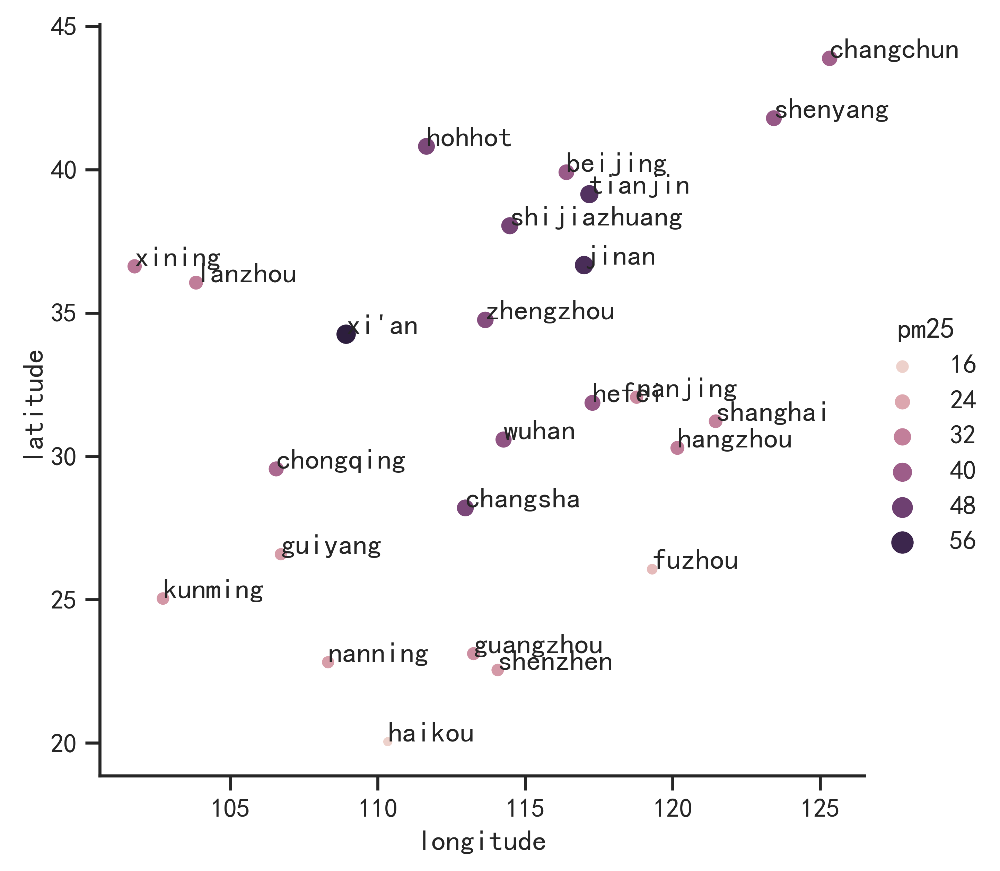

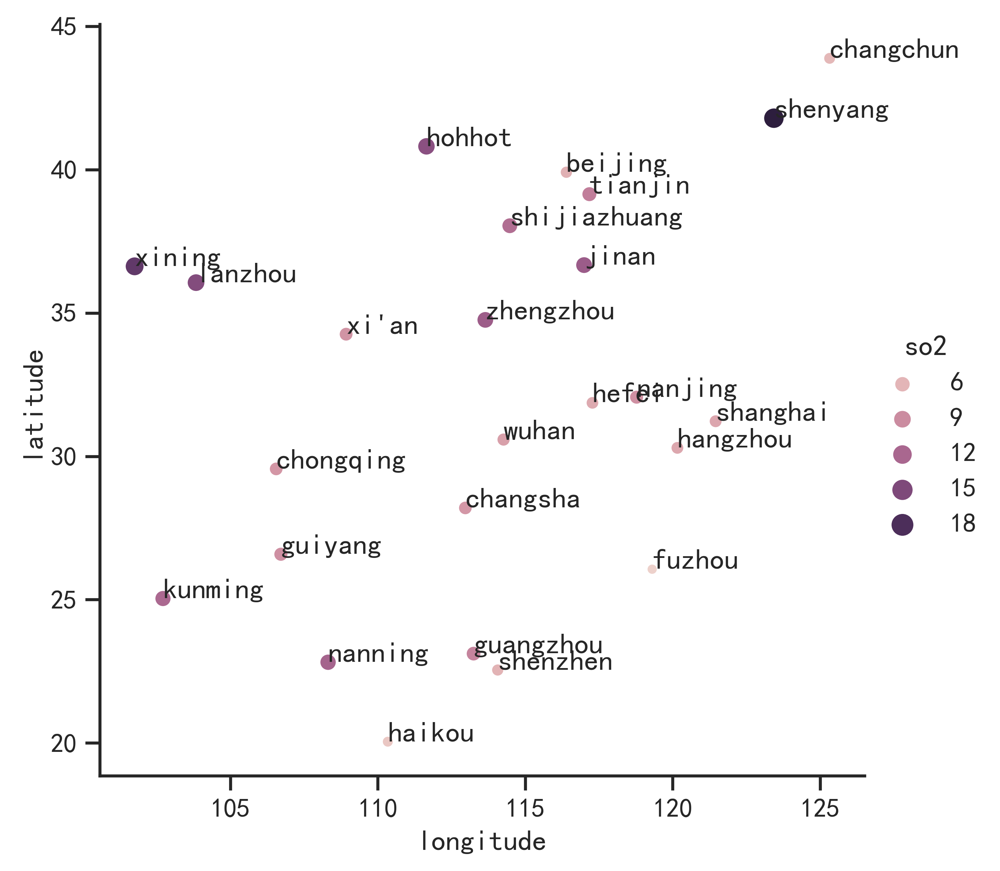

In [37]:
sns.relplot(data=result,
            x='longitude',
            y='latitude',
            kind='scatter',
            hue='pm25',
            size='pm25')
for i in range(result.shape[0]):
    plt.text(x=result['longitude'][i],
             y=result['latitude'][i],
             s=result.index[i])
sns.relplot(data=result,
            x='longitude',
            y='latitude',
            kind='scatter',
            hue='so2',
            size='so2')
for i in range(result.shape[0]):
    plt.text(x=result['longitude'][i],
             y=result['latitude'][i],
             s=result.index[i])
plt.show()

  Then we would like the correlation between the 8 factors and 2 air pollutants, as well as the correlation between these factors. Therefore, we calculate the correlation matrix. The correlation between two variables ranges from -1 to 1 and it represent how strong their relation is. The bigger the number is, the stronger relation between these two variables. According to this definition, we draw a heat graph. 
  From the graph below, it is obvious that geographical factors and meteorological factors have relation with each other, which means that higher “latitude” may lead to lower average temperature (-0.86), lower average wind speed (-0.43), lower average precipitation (-0.72) and higher average sea-level air pressure (0.62). Therefore, it reasonable to drop the geographical factors in the later analysis, because this can avoid some repeated work.

  Also, there are evidences that both of the two air pollutants’ emission have negative relation with average temperature (-0.48(PM2.5), -0.56(SO2)), average wind speed (-0.35(PM2.5), -0.41(SO2)) and average precipitation (-0.55(PM2.5), -0.59(SO2)), and positive relation with average sea-level air pressure (0.50(PM2.5), 0.50(SO2)). Also, there is no strong evidence to show that the relation between two air pollutants’ emission and the elevation and population.

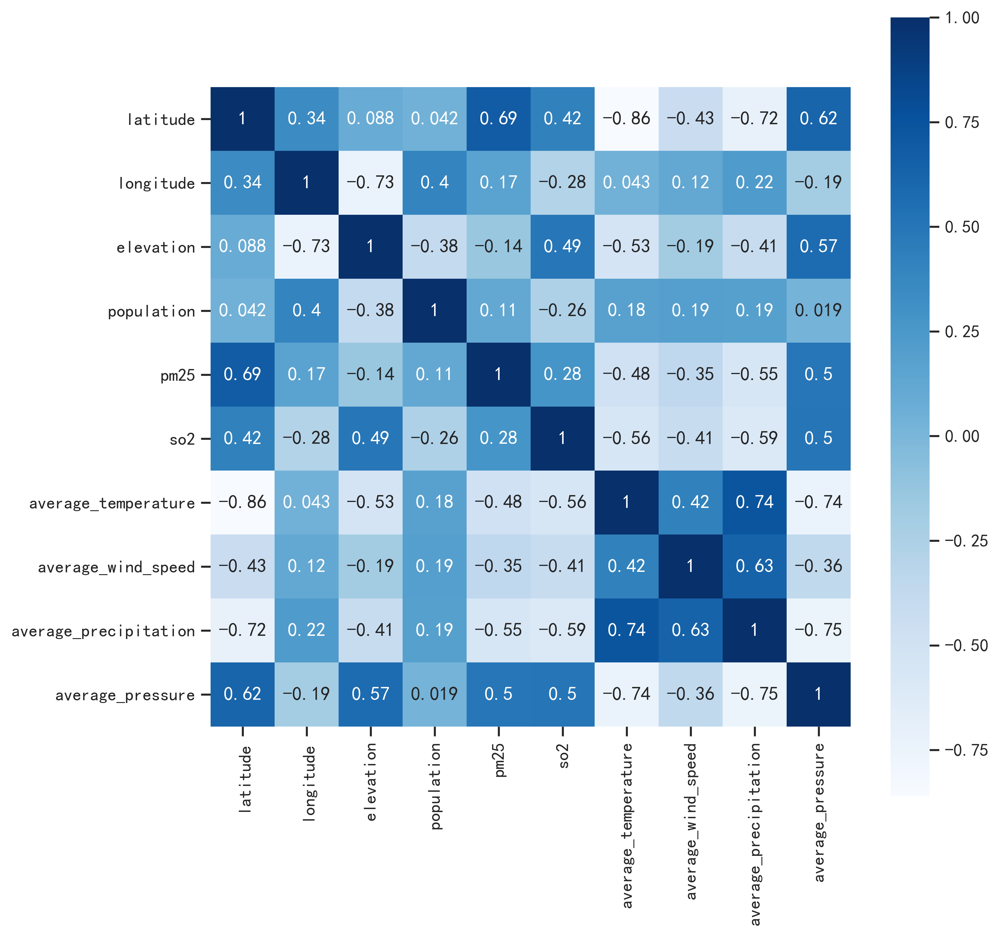

In [38]:
# Calculate the correlation matrix
corr = result.corr()
# Change the axes.unicode to show minus
plt.rcParams['axes.unicode_minus'] = False
plt.subplots(figsize=(9, 9))
sns.heatmap(corr, annot=True, vmax=1, square=True, cmap="Blues")
plt.show()

Because we have proved that it is reasonable to drop the geographical factors in the later analysis, now we rebuild the data frame,called 'data_pm25'and 'data_so2',and discard the frame result_1.

In [39]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [40]:
from sklearn.preprocessing import scale,StandardScaler
scaler= StandardScaler()
# Rebuild the data for pollutant, PM2.5
data_pm25=pd.concat([result_pm25,meto],axis=1)
# Rename the index
data_pm25.index=city_name_EN
# Rebuild the data for pollutant, SO2
data_so2=pd.concat([result_so2,meto],axis=1)
# Rename the index
data_so2index=city_name_EN

# Scaler the data frame to exclude interference with image shapes due to different factor variables' units
scaler_pm25= StandardScaler()
pm25 = scaler_pm25.fit_transform(data_pm25)
scaler_so2= StandardScaler()
so2 = scaler_so2.fit_transform(data_so2)

# Transform the type of data from nparray to dataframe
index_pm25 = data_pm25.index
columns_pm25 = data_pm25.columns
scaled_pm25= pd.DataFrame(pm25, index=index_pm25, columns=columns_pm25)
index_so2 = data_so2.index
columns_so2 = data_so2.columns
scaled_so2= pd.DataFrame(so2, index=index_so2, columns=columns_so2)


In [41]:
# Drop the parameter of the pollutant factors: PM2.5 and SO2, so that we can use melt to convert wide dataframe into long dataframe
scaled_pm25_drop =scaled_pm25.drop('pm25',axis = 1).columns
scaled_so2_drop =scaled_so2.drop('so2',axis = 1).columns
# extract rows that contains PM25  for analysis
data_pm25_long = scaled_pm25.melt(id_vars='pm25',value_vars=scaled_pm25_drop)
data_so2_long = scaled_so2.melt(id_vars='so2',value_vars=scaled_so2_drop)

Next, we draw several subplots to show these conclusions more intuitively.

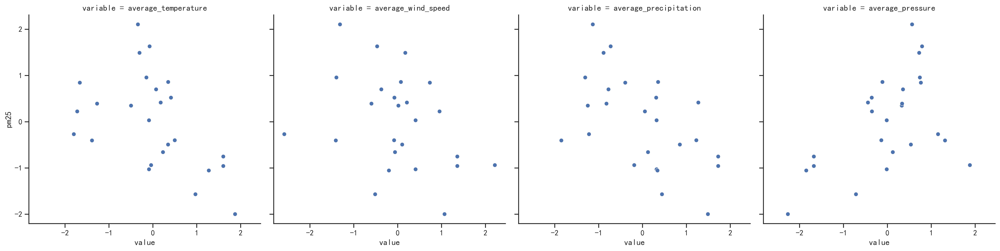

In [43]:
#Subplots for parameter PM2.5 according to meteorological factors: 
#annual average temperature, annual average wind speed, annual average precipitation and annual average sea-level air pressure.
sns.relplot(data=data_pm25_long,
            x='value',
            y='pm25',
            kind='scatter',
            col='variable',
            col_wrap=4)

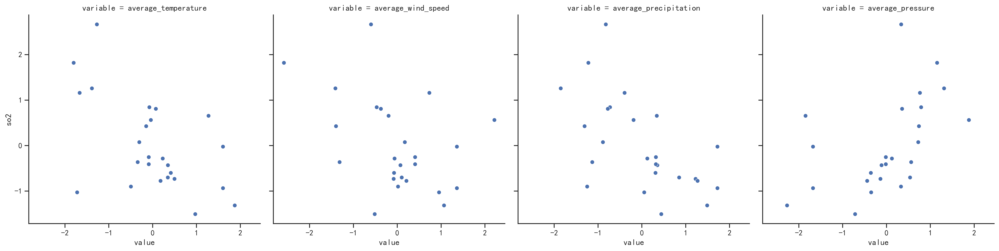

In [44]:
#Subplots for parameter SO2 according to meteorological factors: 
#annual average temperature, annual average wind speed, annual average precipitation and annual average sea-level air pressure.
sns.relplot(data=data_so2_long,
            x='value',
            y='so2',
            kind='scatter',
            col='variable',
            col_wrap=4)

Conclution:

1.Because geographical factors and meteorological factors are not independent, it is advisable to keep meteorological factors and discard geographical factors.

2.Both PM2.5 and SO2 emission have negative relation with average temperature, average wind speed and average precipitation, and positive relation with average sea-level air pressure.

3.There is no strong evidence to show that the relation between two air pollutants’ emission and the elevation and population.


## Part 3

# Visualize the general air quality of 30 provinces
From the piture we can see that the pollution around Beijing is the most serious.
But interestingly, although Beijing is surrounded by heavily polluted cities, the pollution condition in Beijing is not serious. Mainly because the new policy in recent years has moved the factory out of Beijing.

In [3]:
# average value of PM2.5 wthin these 3 years
mean_list = np.mean(pm_series.iloc[:,2:])
mean_list

济南市      54.357592
北京市      40.139684
上海市      31.401747
天津市      51.313866
重庆市      37.961132
哈尔滨市     38.644341
长春市      39.361173
沈阳市      43.462158
呼和浩特市    37.006063
石家庄市     49.145064
乌鲁木齐市    72.460697
兰州市      26.824201
西宁市      28.294208
西安市      50.084509
银川市      31.521970
郑州市      54.536621
太原市      56.518682
合肥市      40.183642
武汉市      39.109607
长沙市      42.271617
南京市      28.970466
成都市      42.603198
贵阳市      28.137250
昆明市      24.694292
南宁市      30.609107
拉萨市      16.643203
杭州市      31.757223
南昌市      21.296236
广州市      25.470242
福州市      20.740592
海口市      15.814622
dtype: float64

In [11]:
!pip install pyecharts
from pyecharts.charts import Map,Geo
from pyecharts import options as opts

# Compare the pollutant index with the region
province_dict = {'Henan': 54.536621, 'Beijing': 40.139684, 'Hebei': 49.145064, 'Liaoning': 43.462158, 'Jinagxi':31.757223, 'Shanghai': 31.401747,
                 'Anhui': 40.183642, 'Jiangsu': 28.970466, 'Hunan': 42.271617,'Zhejiang': 31.757223, 'Hainan': 15.814622, 'Guangdong': 25.470242, 
                 'Hubei': 39.109607, 'Heilongjiang': 38.644341, 'Shaanxi': 50.084509, 'Sichuan': 28.970466, 'Chongqing': 37.961132, 
                 'Yunnan':24.694292, 'Guizhou': 28.137250, 'Jilin': 39.361173, 'Shanxi': 54.536621, 'Shandong': 54.357592, 'Fujian': 20.740592,
                 'Qinghai': 28.294208,'Tianjin': 51.313866, 'Tibet': 16.643203, 'Xinjiang':71.029314, 'Gansu': 26.824201,'Ningxia':31.521970,'Guangxi':30.609107}

# create a dictionary storing the character of cities in China 
# in this way we can transfer the Chinese character intoo English one
name_map = {'河南':'Henan','北京':'Beijing','河北':'Hebei','辽宁':'Liaoning','江西':'Jinagxi','上海': 'Shanghai','安徽':'Anhui',
            '江苏': 'Jiangsu','湖南':'Hunan','浙江': 'Zhejiang','海南':'Hainan','广东':'Guangdong','湖北':'Hubei',
                    '黑龙江': 'Heilongjiang','陕西':'Shaanxi','四川': 'Sichuan','内蒙古':'Inner Mongolia','重庆':'Chongqing',
            '云南':'Yunnan','贵州':'Guizhou','吉林': 'Jilin','山西': 'Shanxi','山东':'Shandong','福建':'Fujian','青海':'Qinghai',
            '天津':'Tianjin','西藏':'Tibet','新疆':'Xinjiang','甘肃':'Gansu','宁夏':'Ningxia','广西':'Guangxi','澳门':'Macao','香港':'Honkong',
           '台湾':'Taiwan'}


province_char = [[item[0],item[1]] for item in province_dict.items()]
print(province_char)

map = Map(init_opts=opts.InitOpts(width='1200px', height='800px'))
map.set_global_opts(
    title_opts=opts.TitleOpts(title="Average PM2.5"),
    visualmap_opts=opts.VisualMapOpts(max_=50))
map.add("China Map Example", data_pair=province_char, maptype='china', is_roam=True,name_map = name_map)
map.render(path="map of China.html")
map.render_notebook()

[['Henan', 54.536621], ['Beijing', 40.139684], ['Hebei', 49.145064], ['Liaoning', 43.462158], ['Jinagxi', 31.757223], ['Shanghai', 31.401747], ['Anhui', 40.183642], ['Jiangsu', 28.970466], ['Hunan', 42.271617], ['Zhejiang', 31.757223], ['Hainan', 15.814622], ['Guangdong', 25.470242], ['Hubei', 39.109607], ['Heilongjiang', 38.644341], ['Shaanxi', 50.084509], ['Sichuan', 28.970466], ['Chongqing', 37.961132], ['Yunnan', 24.694292], ['Guizhou', 28.13725], ['Jilin', 39.361173], ['Shanxi', 54.536621], ['Shandong', 54.357592], ['Fujian', 20.740592], ['Qinghai', 28.294208], ['Tianjin', 51.313866], ['Tibet', 16.643203], ['Xinjiang', 71.029314], ['Gansu', 26.824201], ['Ningxia', 31.52197], ['Guangxi', 30.609107]]


In [45]:
from sklearn.decomposition import PCA

As indicated by the first part of the report, Beijing is in the class of explainary variable and can be considered as a representative city.

So here we get further investigation on the pollutans, PM2.5,PM10,SO2,O3,No,in Beijing against the meteorological data in year 2020.

In [46]:
api = openaq.OpenAQ(version='v2')

def getLocations(city,parameter):
    """
    Input:
        city: character
        parameter: character
    Output: 
        locations_df: tidied dataframe where each row indicates an unique loation in beijing
        locations: a list storing unique locations 
    """
    # get number and name of unique locations in Beijing
    locations_p1 = api.measurements(df = True,limit = 10000,city = city,parameter = parameter)
    locations_df = locations_p1.pivot_table(index='location',aggfunc={'coordinates.latitude': pd.unique,
                                                                   'coordinates.longitude': pd.unique,
                                                                   'parameter':pd.unique,
                                                                  'value': pd.Series.mean})
    # store the unique locations into a list
    locations = locations_df.index.to_list()

    return locations_df,locations
              

locations = getLocations('北京市','pm25')[1]


# get the columns name of the dataframe 
# so that we can use it as a input for following "getParamSamples"
columns = getLocations('北京市','pm25')[0].columns.values
def getParamSamples(param_list,locations,city,start,end,columns):
    """
    Input:
        param_list: a list storing parameters we are interested
        locations: a list storing unique locations
        city: character
        start: start data for the time we interested
        end: end data for the time we interested
    Output: 
        tol_param_list: list storing the locations that have all selected parameters data for the year
        df: a dataframe contrains locations in tol_param_list and the parameters value for the time
    """
    #initial lists to store the locations that have the selected parameter data from 2020-01-01,
    pm25 = []
    pm10 = []
    so2 = []
    no2 = []
    o3 = []
    
    # initialize the dataframe
    df = pd.DataFrame(columns=columns)

    for i in locations:
        n = 0
        while n < 5:
            try:
                df1 = api.measurements(city = city,parameter = param_list[n],location = i,
                                      df = True,limit = 100000,date_from= start,date_to= end)
                df = pd.concat([df,df1],axis = 0)
                if n == 0:
                    pm25.append(i) 
                elif n == 1:
                    pm10.append(i) 
                elif n == 2:
                    so2.append(i) 
                elif n == 3:
                    no2.append(i) 
                elif n == 4:
                    o3.append(i) 
            except:
                next
            n += 1
            
    # creat the list to store the locations that have all selected parameters data for the year       
    tol_param_list = set(pm25 + pm10 + so2 + no2 + o3)
    
    return tol_param_list,df

param_list = ['pm25','pm10','so2','o3','no2']
locations = getLocations('北京市','pm25')[1]
locations_sample,data_df = getParamSamples(param_list,locations,'北京市','2020-01-01','2020-12-31',columns) 


In [48]:
data_df.head(5)

,coordinates.latitude,coordinates.longitude,parameter,value,locationId,location,unit,country,city,isMobile,isAnalysis,entity,sensorType,date.utc
2020-12-31 08:00:00,39.8784,116.3621,pm25,17,9792.0,万寿西宫,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,False,False,government,reference grade,2020-12-31 00:00:00+00:00
2020-12-31 07:00:00,39.8784,116.3621,pm25,13,9792.0,万寿西宫,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,False,False,government,reference grade,2020-12-30 23:00:00+00:00
2020-12-30 21:00:00,39.8784,116.3621,pm25,7,9792.0,万寿西宫,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,False,False,government,reference grade,2020-12-30 13:00:00+00:00
2020-12-30 20:00:00,39.8784,116.3621,pm25,7,9792.0,万寿西宫,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,False,False,government,reference grade,2020-12-30 12:00:00+00:00
2020-12-30 19:00:00,39.8784,116.3621,pm25,3,9792.0,万寿西宫,b'\xc2\xb5g/m\xc2\xb3',CN,北京市,False,False,government,reference grade,2020-12-30 11:00:00+00:00


After grabing the data we need, the next thing is to tidy the data to get a table giving information about the average value for the selected five pollutans in twelve months, and show the variations during the year with different colors labelled.

In [49]:
# create a copy of the dataframe we got before as it could be used for subsequent investigation
monthly_param = data_df.copy()

# transfer the data type of 'date.utc' into time series
# add a new column indicating which month the data belong to 
# transfer the data type of 'value' from object to float so that we can aggregate the data 
monthly_param['date.utc'] = pd.to_datetime(monthly_param['date.utc'])
monthly_param['month'] = monthly_param['date.utc'].dt.month
monthly_param['value'] =  monthly_param['value'].astype(float)

# group the data by month and parameter 
# get the average value for each month and parameter
mean = monthly_param.groupby(['month','parameter'])['value'].mean()
monthly_param = pd.DataFrame({"mean":mean}).reset_index()

# convert the wide data into long data, month as rows and parameter as columns for a better view
table = monthly_param.pivot_table(index='month', columns='parameter', values='mean', aggfunc=pd.Series.mean)
print(table)


parameter        no2          o3       pm10       pm25       so2
month                                                           
1          39.538159   66.087478  66.393270  58.681472  6.090413
2          26.963244   79.776330  56.143761  59.316260  4.023169
3          26.262417   95.419882  52.979108  33.797717  4.025240
4          25.714779  131.457090  67.882568  32.873578  3.834077
5          22.299887  145.372782  55.693764  34.321293  3.464866
6          22.361837  197.309976  63.089445  32.032693  3.252723
7          20.089846  172.151584  45.790359  39.660488  2.682705
8          21.264433  153.803276  41.483534  28.113455  2.589225
9          24.955630  112.069673  33.849978  22.956617  2.609735
10         40.827512   76.085631  71.968020  43.872141  3.199663
11         42.835032   50.364041  63.136993  38.246615  3.341246
12         37.527719   49.716195  56.392642  27.699187  4.829622


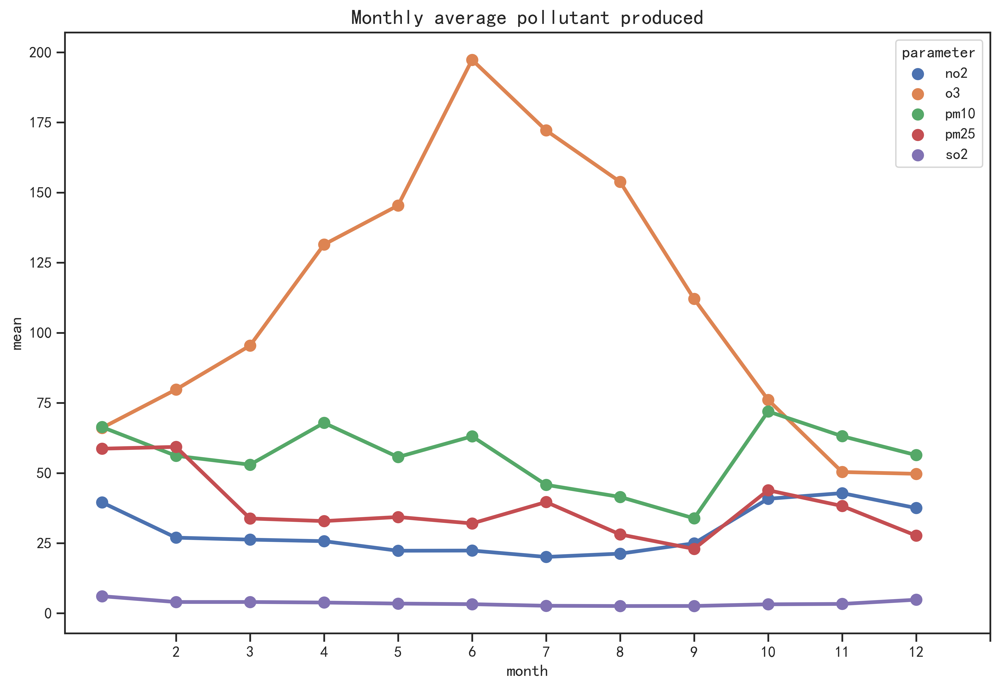

In [50]:
# plot the variations of these five pollutants in general
plt.figure(figsize=(12,8))
grid = sns.pointplot(data=monthly_param,
                   x='month',
                   y='mean',
                   hue='parameter',
                   height=5,
                   aspect=5)


# Set the x-axis ticks and labels to show the twelve months for the year 2020
grid.set(xticks=monthly_param['month'].unique())
grid.set_title('Monthly average pollutant produced',fontdict=dict(fontsize=15,weight='bold'))
plt.show()

From the plot we can see, the O3 experienced an obvious increase from the start of the year and peaked at June, then indicates a clear decline trend until December, as the cause of O3 produced is very complex, one likely scenario here is, high produced O3 may be connected with intense solar radiation and high temperatures. Another interest thing we notice is that value of the PM2.5 also has seasonal pattern, generally it keeps high in summer and winter. 

To investigate in detail, here we apply Principal Components Analysis to our dataset to get the parameters that are more explainable and support our points.

Firstly we have to scale our pollutant factor and get the correlation coefficient matrix. We find that our variabls are not independantly distrubute as the correlation coefficient are a bit high indicated by the 'param_corr' table.
Then it is reasonal to apply PCA to understand which is the contribution of the original variables to the principal components and compute the Loadings Matrix.

In [51]:
#correlation coefficient matrix for variables(pollutants)
param_corr = table.corr()
print(f'Correlation Matrix:\n{param_corr}')

# apply PCA
pca = PCA(n_components=5)
# standardise our data
table_S = scale(table)
pca.fit(table_S)

# component score
X_pca = pca.fit_transform(table_S)
# Percentage of variance explained by each of the selected components
param_ratio = pca.explained_variance_ratio_

# aggregate the accumulated ratio until if it over or near 80%
print('\ncomponents:')
for idx, val in enumerate(param_ratio, 1):
    print("Principle component%d:%.2f%%" % (idx, val * 100))

print('\nThe fisrt two component neary accumulated to 80%')
print('Extract the first two components as principal component.')


components = {'component1': X_pca[:,0],
               'component2' : X_pca[:,1]}
component_table = pd.DataFrame(components)
component_table.index = range(1,13)

print('\nMonthly average score of principal components in Beijing:')
print(component_table)
#cite:
#https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

Correlation Matrix:
parameter       no2        o3      pm10      pm25       so2
parameter                                                  
no2        1.000000 -0.855065  0.585426  0.353997  0.518036
o3        -0.855065  1.000000 -0.303673 -0.356385 -0.561988
pm10       0.585426 -0.303673  1.000000  0.476051  0.498054
pm25       0.353997 -0.356385  0.476051  1.000000  0.538302
so2        0.518036 -0.561988  0.498054  0.538302  1.000000

components:
Principle component1:60.74%
Principle component2:17.63%
Principle component3:11.97%
Principle component4:8.30%
Principle component5:1.37%

The fisrt two component neary accumulated to 80%
Extract the first two components as principal component.

Monthly average score of principal components in Beijing:
    component1  component2
1     3.363364   -0.863441
2     1.101300   -0.980114
3    -0.118092    0.280961
4    -0.062826   -0.605711
5    -1.001678   -0.532180
6    -1.411419   -1.234836
7    -1.964377   -0.761358
8    -2.326350    0.302120


Computing the Loadings from this trained PCA above to determine the which variables(pollutants) contribute to the most explainable component getting from PCA.

In [52]:
# compute the loading matrix
Loadings_M = pca.components_.T * np.sqrt(pca.explained_variance_)

# extract the loadings on the first two components and transfer it into dataframe 
Loadings= {'component1': Loadings_M[:,0],
               'component2' :Loadings_M[:,1]}
Loadings_table = pd.DataFrame(Loadings)
Loadings_table.index = table.columns.values.tolist()
print('Loadings:')
print(Loadings_table)

Loadings:
      component1  component2
no2     0.908645    0.410302
o3     -0.848213   -0.540502
pm10    0.756693   -0.371906
pm25    0.704196   -0.577225
so2     0.836266   -0.171453


The higher the loadings, the more information the corresponding component explained on.

We knew from the monthly average score of principal components that the first principal component has a high contribution up to 60% and with a large loads on NO2,O3,PM10 and SO2, which are 0.9,0.84,0.75,0.83 respectively. Besides, PM25 has the largest load,0.58, on the second component. 

So we conclude that the component1 indicates information mostly on NO2,O3,PM10 and SO2, we named it as "other pollutant factor", the other component 2 highly connected with PM25 so we call it as "PM25".

Divide twelve months into four categories and visualize in a quadrantal diagram according to its scores on these two components, this is a straight and clear way to examine air pollution. 

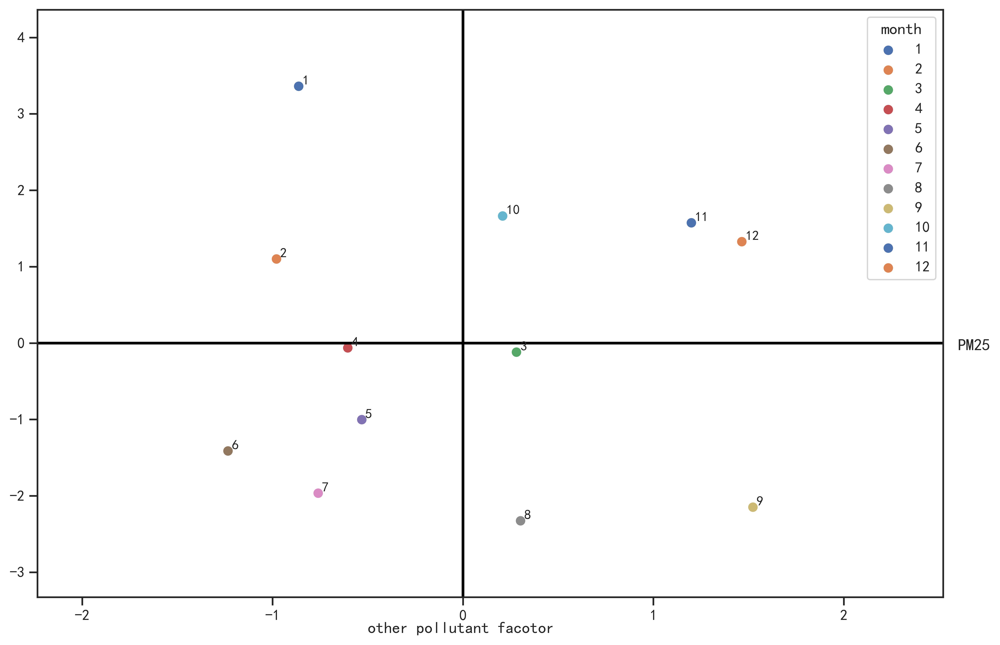

In [53]:
# draw the monthly average score of two principal components in a 
component_score = component_table.copy()
component_score.columns = ['other pollutant facotor','PM25']

# lable different months with different colors on the scatter plot
labels = component_score.index


# set the graphics size and pixels
plt.figure(figsize=(12,8))

# scope for coordinate
minx = min(component_score["PM25"])
maxx = max(component_score["PM25"])
miny = min(component_score['other pollutant facotor'])
maxy = max(component_score['other pollutant facotor'])

# here draw the scatter through a loop 
# so that we can label different month seperately 
for i in labels:
    plt.scatter(component_score["PM25"][i], component_score['other pollutant facotor'][i], label=i)
    plt.text(component_score["PM25"][i]+0.02, component_score['other pollutant facotor'][i]+0.02,s = i,
            fontdict=dict(fontsize=10,weight='bold'))
    

plt.xlim(xmin = minx-1,xmax=maxx+1)
plt.ylim(ymin= miny-1,ymax=maxy+1)

# create two axis manually, x indicates PM25, y indicates other pollutant factor
plt.axhline(y=0,ls="-",color="black",linewidth=2)
plt.axvline(x=0,ls="-",color="black",linewidth=2)

# name our specified axes
plt.text(x=-0.5,y=-3.8,s='other pollutant facotor',ha='left',va='baseline',fontdict=dict(fontsize=12,weight='bold'))
plt.text(x=2.6,y=-0.1,s='PM25',ha='left',va='baseline',fontdict=dict(fontsize=12,weight='bold'))

plt.legend(title="month")

plt.show()

Combined with the discussion on the causes listed in the second part, we speculate according to the above phenomenon as following:

Most of the scores of the two components in the third quadrant are relatively low, indicating the lower levels of air pollution, involving April and May, that is, the early summer stage. During this period, the temperature is high, so the pollution particles are relatively easy to diffuse. Besides, at this time, it rains more frequently, with higher wind speed and lower air pressure, forming a static and stable whether condition under which the pollution particle is hardly seen. 

The scores of PM2.5 in the first and second quadrants are high, indicating that PM2.5 accounts for a large proportion of air pollution components, which mainly occurs in November and December. And this is well reflected in the monthly average pollutant produced map above, because the concentration of PM2.5 particles is at a high level in these months. And meanwhile, the PM index in January, February and June is high, especially in January, when the indices of other pollutant factors are also at a high level. According to this, the further speculation on the causes is that there is a long period of static and stable weather in winter, with high air pressure, less rain and low wind speed; in addition, the rapidly increasing energy consumption in the heating period in the North has greatly increased the pollution discharged into the atmosphere.

In order to further verify our speculation, we will use Time Series Analysis to analyse the PM2.5, O3 distribution and the corresponding weather data of Beijing in the whole year of 2020, so as to complete a detailed analysis process from face to point in this part.


<AxesSubplot:xlabel='date.utc', ylabel='value'>

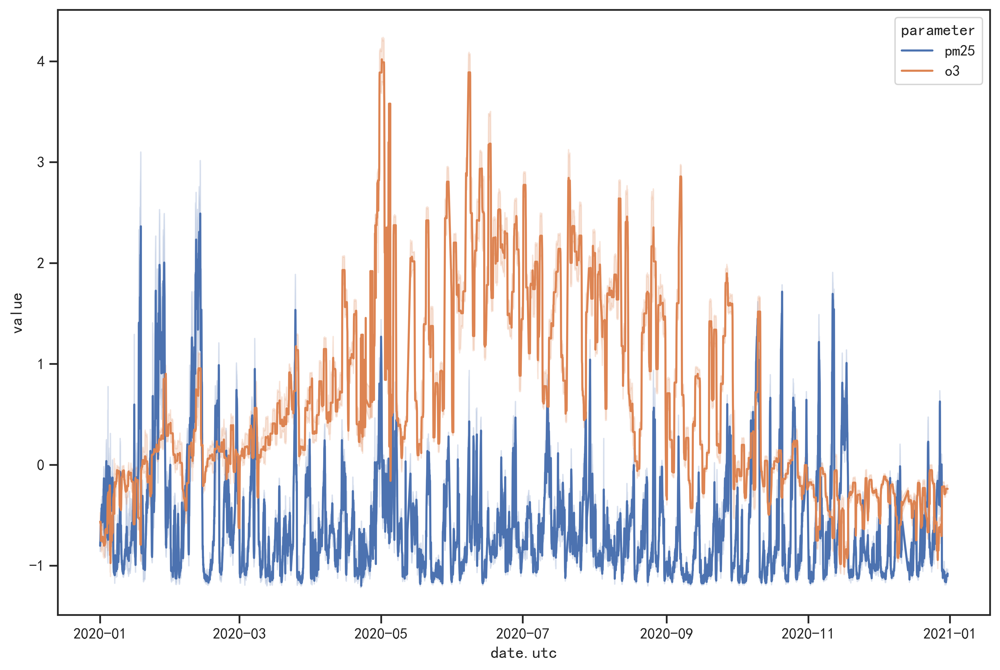

In [60]:
data_pm25_O3 = data_df.copy()
# extract rows that contains PM25 and O3 for analysis
data_pm25_O3 = data_pm25_O3[(data_pm25_O3['parameter'] == 'pm25') | (data_pm25_O3['parameter'] == 'o3')]

# scale the value to better represent the plot
scale_pm25_O3 = scale(data_pm25_O3['value'].values)

# using .loc for multiple items using a fixed index

data_pm25_O3.loc[:, 'value'] = scale_pm25_O3

data_pm25_O3['value'] =  data_pm25_O3['value'].astype(float)


plt.figure(figsize=(12,8))
sns.lineplot(data=data_pm25_O3,x='date.utc',y = 'value',hue='parameter')


#sns.set(xticks=monthly_param['month'].unique())
#grid.set_title('Monthly average pollutant produced',fontdict=dict(fontsize=15,weight='bold'))


# data_pm25_O3.dtypes

In [55]:
stations = Stations()

# obtaining meteorological data for Beijing in year 2020
start = datetime(2020, 1, 1)
end = datetime(2020, 12, 31)
meto_data_beijing = Daily(54511, start, end)
meto_df_beijing = meto_data_beijing.fetch()


# drop the columns that all are na values
meto_df_beijing = meto_df_beijing.dropna(axis=1,how='all') 

# fill the na values in rows with 0
meto_df_beijing = meto_df_beijing.fillna(0)


In [56]:
meto_df_beijing1 = meto_df_beijing.drop(['tmin','tmax','wdir'],axis = 1)
meto_df_beijing

,tavg,tmin,tmax,prcp,snow,wdir,wspd,pres
time,,,,,,,,
2020-01-01,-6.5,-11.9,0.6,0.0,0.0,117.1,6.8,1032.2
2020-01-02,-2.7,-10.4,4.2,0.0,0.0,125.5,6.9,1031.3
2020-01-03,-1.4,-8.0,7.7,0.0,0.0,148.0,5.3,1028.7
2020-01-04,0.2,-6.0,10.0,0.0,0.0,101.7,7.9,1028.6
2020-01-05,0.0,-6.0,9.6,4.8,0.0,65.2,4.3,1031.2
...,...,...,...,...,...,...,...,...
2020-12-27,-1.1,-7.0,7.5,0.0,0.0,88.1,6.2,1020.1
2020-12-28,-3.3,-6.0,7.5,0.0,0.0,67.9,8.4,1028.2
2020-12-29,-11.6,-14.0,2.1,0.0,0.0,329.5,30.6,1041.4


In [57]:
# standard our meteorological data as they are in different units, scale here to eliminate the gap
scaler= StandardScaler()
meto_scale_data = scaler.fit_transform(meto_df_beijing1)

meto_index = meto_df_beijing1.index
meto_columns = meto_df_beijing1.columns
Scaled_metodf_beijing = pd.DataFrame(meto_scale_data, index=meto_index, columns=meto_columns)

# add a column that identify variables
# so that we can use melt to convert wide dataframe into long dataframe
Scaled_metodf_beijing['date'] = meto_index 
Scaled_metodf_beijing_long = Scaled_metodf_beijing.melt(id_vars='date',value_vars=meto_columns)


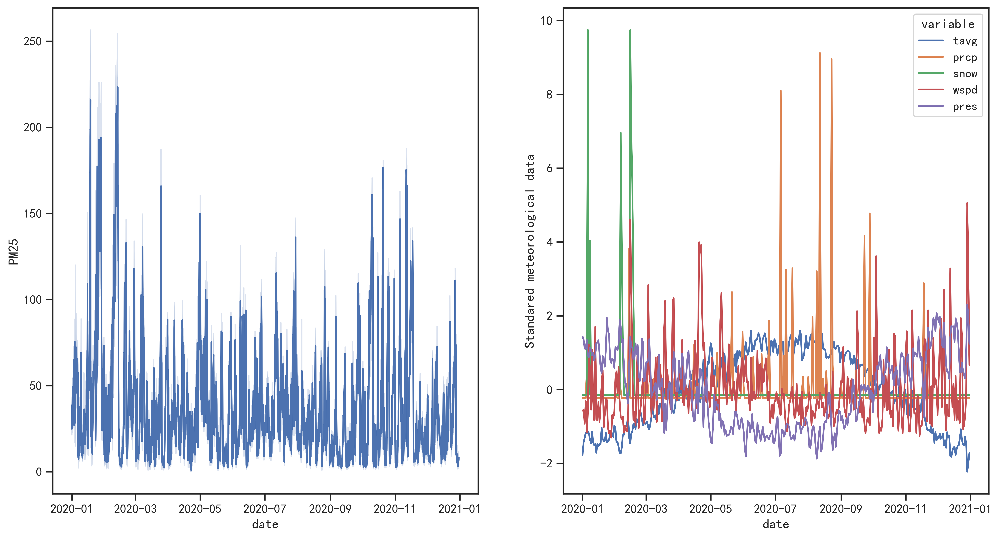

In [58]:
data_pm25 = data_df.copy()
# extract rows that contains PM25  for analysis
data_pm25 = data_pm25[(data_pm25['parameter'] == 'pm25')]

# transfer the data type of 'value' from object to float so that we can aggregate the data 
data_pm25['value'] =  data_pm25['value'].astype(float)

# two subplot
fig, axes = plt.subplots(figsize=(15, 8), ncols=2)

sns.lineplot(ax=axes[0],data=data_pm25,x='date.utc',y = 'value')
sns.lineplot(ax=axes[1],data=Scaled_metodf_beijing_long,x='date',y = 'value',hue = 'variable')
axes[0].set(xlabel='date', ylabel='PM25')
axes[1].set(xlabel='date', ylabel='Standared meteorological data')


plt.show()


From the figure above, it can be seen that the emission of PM2.5 increases sharply during November to February in winter, especially in January and February with snowfall, high air pressure and less precipitation, which confirms our oppinion.
Besides, PM2.5 also experienced a rise around July. By looking through the data, we find that the temperature rose sharply during this period, which was in summer. However, due to low pressure and more precipitation, the data range was not as high as winter.

## Summery:

1.30 provinces can be clusters into 6 groups: 

class 1: '哈尔滨市', '长春市', '沈阳市';
class 2: '上海市', '兰州市', '西宁市', '银川市', '南京市', '贵阳市', '南宁市', '杭州市';
class 3: '昆明市', '拉萨市', '南昌市', '广州市', '福州市', '海口市';
class 4: '乌鲁木齐市';
class 5: '济南市' '天津市' '西安市' '郑州市' '太原市 ;
class 6: '北京市', '重庆市', '石家庄市', '合肥市', '武汉市', '长沙市', '成都市';

2.PM2.5 emission has negative relation with average temperature, average wind speed and average precipitation, and positive relation with average sea-level air pressure.

3.In the case of Beijing, the emission of PM2.5 increases sharply during November to February in winter, especially in January and February with snowfall, high air pressure and less precipitation. It also experienced a rise around July, as the temperature rose sharply during this period. 
4.In summer, due to low pressure and more precipitation, the data range was not as high as winter.